In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
%pwd
%cd /content/drive/MyDrive/contest3/
%ls -l

/content/drive/MyDrive/contest3
total 189557
-rw------- 1 root root   479115 Nov 27 13:13 baseline-deeplabv3-crack-segmentation.ipynb
-rw------- 1 root root 72055804 Nov 23 00:03 copy-of-crack-segmentation-cnu.zip
-rw------- 1 root root   718488 Nov 28 03:27 crack_detection.ipynb
drwx------ 2 root root     4096 Nov 27 11:14 data/
-rw------- 1 root root 67708808 Nov 22 05:11 DeepCrack.zip
drwx------ 2 root root     4096 Nov 27 11:57 DeepSegmentor/
drwx------ 2 root root     4096 Nov 28 14:31 HrSegNet4CrackSegmentation/
-rw------- 1 root root   197361 Dec  2 04:38 HrSegNet+FocalLoss.ipynb
-rw------- 1 root root   893661 Nov 29 16:32 HrSegNet.ipynb
-rw------- 1 root root   356246 Dec  2 11:55 HrSegNet_v2.ipynb
drwx------ 2 root root     4096 Nov 27 11:25 kaggle_dataset/
drwx------ 2 root root     4096 Nov 27 13:28 model_checkpoint/
-rw------- 1 root root 51674219 Nov 29 12:02 results.csv
-rw------- 1 root root      331 Nov 27 10:28 slient_night_holy_night.txt


In [ ]:
!pip install torchmetrics

In [ ]:
!git clone https://github.com/CHDyshli/HrSegNet4CrackSegmentation.git

In [ ]:
!pip install paddlepaddle-gpu

In [ ]:
!pip install paddleseg

In [4]:
import warnings
warnings.filterwarnings('ignore')

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tqdm.autonotebook import tqdm

from sklearn.model_selection import train_test_split

from glob import glob
import torch
import torch.nn as nn
from torchvision import transforms as T
import albumentations as A
from torch.utils.data import Dataset, DataLoader
import torchvision
import random, gc

from albumentations.pytorch.transforms import ToTensorV2
import torch.nn.functional as F

seed=42

In [5]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"current device : {device}")

current device : cuda


In [6]:
CFG = {
    'EPOCHS' : 90,
    'LEARNING_RATE' : 1e-4,
    'NUM_CLASSES' : 1,
    'BATCH_SIZE' : 8,
    'SEED' : 42,
    'IMAGE_SIZE' : 256,
    'PATH' : os.path.join('/content/drive/MyDrive/contest3/model_checkpoint/', 'segment_model.pth')
}

In [7]:
def init_seed(seed):
  torch.manual_seed(seed)
  torch.cuda.manual_seed(seed)

  np.random.seed(seed)

  random.seed(seed)

  gc.collect()
  torch.cuda.empty_cache()

init_seed(CFG['SEED'])

In [8]:
base_path = '/content/drive/MyDrive/contest3/kaggle_dataset/'
path_to_images = os.path.join(base_path, 'train_img')
path_to_masks = os.path.join(base_path, 'train_lab')

image_paths = sorted(glob(path_to_images + '/*.jpg'))
mask_paths = sorted(glob(path_to_masks + '/*.png'))

In [9]:
test_files = pd.read_csv(os.path.join('/content/drive/MyDrive/contest3/kaggle_dataset/', 'test_files.csv'))
test_files

,ID,label
0,11194.jpg,0
1,11270-2.jpg,0
2,11296-6.jpg,0
3,11231-9.jpg,0
4,11249-6.jpg,0
...,...,...
232,IMG_6542-7.jpg,0
233,11295.jpg,0
234,11169-2.jpg,0
235,11247-8.jpg,0


In [10]:
print("img file counts : ", len(image_paths))
print("mask file counts : ", len(mask_paths))

img file counts :  300
mask file counts :  300


In [11]:
print("test file counts : ", len(test_files))

test file counts :  237


In [12]:
train_df = pd.DataFrame({'ID' : image_paths, 'label' : mask_paths})
train_df.head(5)

,ID,label
0,/content/drive/MyDrive/contest3/kaggle_dataset...,/content/drive/MyDrive/contest3/kaggle_dataset...
1,/content/drive/MyDrive/contest3/kaggle_dataset...,/content/drive/MyDrive/contest3/kaggle_dataset...
2,/content/drive/MyDrive/contest3/kaggle_dataset...,/content/drive/MyDrive/contest3/kaggle_dataset...
3,/content/drive/MyDrive/contest3/kaggle_dataset...,/content/drive/MyDrive/contest3/kaggle_dataset...
4,/content/drive/MyDrive/contest3/kaggle_dataset...,/content/drive/MyDrive/contest3/kaggle_dataset...


In [13]:
test_files['ID'] = base_path + '/test_img/' + test_files['ID']
test_files.head(5)

,ID,label
0,/content/drive/MyDrive/contest3/kaggle_dataset...,0
1,/content/drive/MyDrive/contest3/kaggle_dataset...,0
2,/content/drive/MyDrive/contest3/kaggle_dataset...,0
3,/content/drive/MyDrive/contest3/kaggle_dataset...,0
4,/content/drive/MyDrive/contest3/kaggle_dataset...,0


In [14]:
train, valid = train_test_split(train_df, test_size=0.1, shuffle=True, random_state=seed)

print(f"splited train size : {len(train)}, \
 validation size: {len(valid)}, test size : {len(test_files)}")


splited train size : 270,  validation size: 30, test size : 237


In [15]:
train_transforms = A.Compose([
    A.Resize(CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']),
    ToTensorV2(),
])

In [16]:
class CrackDataset(Dataset):
  def __init__(self, dataset, train_mode=True, transforms=train_transforms):
    self.dataset = dataset.reset_index(drop=True)
    self.transforms = transforms
    self.train_mode = train_mode

  def __len__(self):
    return len(self.dataset)

  def __getitem__(self, idx):
    row = self.dataset.loc[idx].squeeze()

    if self.train_mode:
      image_path = row['ID']
      image = cv2.imread(image_path)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.uint8)
      image = (image/255).astype(np.float32) # Normalize step
      image_tensor = self.transforms(image=image)

      mask_path = row['label']
      mask = cv2.imread(mask_path)
      mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
      mask = cv2.resize(mask, (CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']))
      _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

      mask_tensor = torch.as_tensor(mask[None], dtype=torch.float32)
      return image_tensor, mask_tensor

    else:
      image_path = row['ID']
      image = cv2.imread(image_path)
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.uint8)
      image = (image/255).astype(np.float32)
      image_tensor = self.transforms(image=image)

      return image_tensor

  def collate_fn(self, batch):
    images, masks = tuple(zip(*batch))
    images = [img['image'][None] for img in images]
    masks = [msk[None] for msk in masks]
    images, masks = [torch.cat(i).to(device) for i in [images, masks]]
    return images, masks

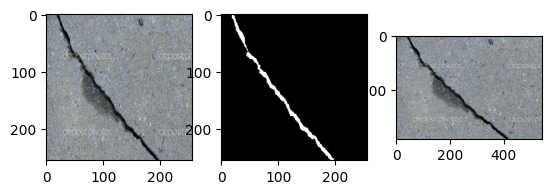

In [17]:
train_data = CrackDataset(train)

idx = 13

plt.subplot(131)
plt.imshow(train_data[idx][0]['image'].cpu().detach().numpy().transpose(1, 2, 0))

plt.subplot(132)
plt.imshow(train_data[idx][1].cpu().detach().numpy().transpose(1, 2, 0), cmap='gray')

plt.subplot(133)
row = train.reset_index(drop=True).loc[idx].squeeze()
image_path = row['ID']
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.uint8)
plt.imshow(image)

In [18]:
train_dataset = CrackDataset(train)
valid_dataset = CrackDataset(valid)
test_dataset = CrackDataset(test_files, train_mode=False)

train_dataloader = DataLoader(train_dataset, batch_size=CFG['BATCH_SIZE'], shuffle=True,
                              collate_fn = train_dataset.collate_fn, drop_last=True)
valid_dataloader = DataLoader(valid_dataset, batch_size=CFG["BATCH_SIZE"], shuffle=False,
                              collate_fn=valid_dataset.collate_fn, drop_last=True)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, drop_last=True)

In [19]:
@torch.no_grad()
def validate_test_image(model, dataset):
  idx = np.random.randint(len(dataset))
  dataset = dataset.reset_index(drop=True)
  row = dataset.loc[idx].squeeze()

  image = cv2.imread(row['ID'])
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.uint8)
  image = (image/255).astype(np.float32)
  image_tensor = train_transforms(image=image)['image'].unsqueeze(0).to(device)

  mask = cv2.imread(row['label'])
  mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
  mask = cv2.resize(mask, (CFG['IMAGE_SIZE'], CFG['IMAGE_SIZE']))
  _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

  model.eval()
  output = model(image_tensor)
  output = output[0].cpu().detach().numpy().transpose(1, 2, 0)

  plt.figure(figsize=(8, 4))
  plt.subplot(131)
  plt.title('Original image')
  plt.imshow(image)

  plt.subplot(132)
  plt.title('Original mask')
  plt.imshow(mask, cmap='gray')

  plt.subplot(133)
  plt.title('Predicted mask')
  plt.imshow(output, cmap='gray')

  plt.tight_layout()
  plt.show()
  plt.pause(0.001)


In [20]:
import math
import torch.nn.functional as F

class HrSegNetB64(nn.Module):
    """
    Args:
        num_classes (int): The unique number of target classes.

        in_channels (int, optional): The channels of input image. Default: 3.

        base (int, optional): The base channel number of the model. Default: 48.
    """
    def __init__(self,
                 in_channels=3, # input channel
                 base=64, # base channel of the model,
                 num_classes=1, # number of classes
                 pretrained=None
                 ):
        super(HrSegNetB64, self).__init__()
        self.base = base
        self.num_classed = num_classes
        self.pretrained = pretrained
        # Stage 1 and 2 constitute the stem of the model, which is mainly used to extract low-level features.
        # Meanwhile, stage1 and 2 reduce the input image to 1/2 and 1/4 of the original size respectively
        self.stage1 = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=base // 2, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(base // 2),
            nn.ReLU(),
        )
        self.stage2 = nn.Sequential(
            nn.Conv2d(in_channels=base // 2, out_channels=base, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(base),
            nn.ReLU(),
        )

        self.seg1 = SegBlock(base=base, stage_index=1)
        self.seg2 = SegBlock(base=base, stage_index=2)
        self.seg3 = SegBlock(base=base, stage_index=3)

        self.aux_head1 = SegHead(inplanes=base, interplanes=base, outplanes=num_classes, aux_head=True)
        self.aux_head2 = SegHead(inplanes=base, interplanes=base, outplanes=num_classes, aux_head=True)
        self.head = SegHead(inplanes=base, interplanes=base, outplanes=num_classes)

        self.init_weight()


    def forward(self, x):
        logit_list = []
        h, w = x.shape[2], x.shape[3]
        # aux_head only used in training
        if self.training:
            stem1_out = self.stage1(x)
            stem2_out = self.stage2(stem1_out)
            hrseg1_out = self.seg1(stem2_out)
            hrseg2_out = self.seg2(hrseg1_out)
            hrseg3_out = self.seg3(hrseg2_out)
            last_out = self.head(hrseg3_out)
            seghead1_out = self.aux_head1(hrseg1_out)
            seghead2_out = self.aux_head2(hrseg2_out)
            logit_list = [last_out, seghead1_out, seghead2_out]
            logit_list = [F.interpolate(logit, size=(h, w), mode='bilinear', align_corners=True) for logit in logit_list]
            return (logit_list[0], logit_list[1], logit_list[2])
        else:
            stem1_out = self.stage1(x)
            stem2_out = self.stage2(stem1_out)
            hrseg1_out = self.seg1(stem2_out)
            hrseg2_out = self.seg2(hrseg1_out)
            hrseg3_out = self.seg3(hrseg2_out)
            last_out = self.head(hrseg3_out)
            logit_list = [last_out]
            logit_list = [F.interpolate(logit, size=(h, w), mode='bilinear', align_corners=True) for logit in logit_list]
            return logit_list[0]

    # we does not use pretrained model on other crack dataset
    def init_weight(self):
      for m in self.modules():
        if isinstance(m, nn.Conv2d):
          torch.nn.init.kaiming_normal_(m.weight)
        elif isinstance(m, nn.BatchNorm2d):
          torch.nn.init.constant_(m.weight, 1)
          torch.nn.init.constant_(m.bias, 0)



class SegBlock(nn.Module):
    def __init__(self,
                 base=32,
                 stage_index=1):# stage_index=1,2,3.
        super(SegBlock, self).__init__()

        #  Convolutional layer for high-resolution paths with constant spatial resolution and constant channel
        self.h_conv1 = nn.Sequential(
            nn.Conv2d(in_channels=base, out_channels=base, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(base),
            nn.ReLU()
        )
        self.h_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=base, out_channels=base, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(base),
            nn.ReLU()
        )
        self.h_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=base, out_channels=base, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(base),
            nn.ReLU()
        )

        # sematic guidance path/low-resolution path
        if stage_index==1: #first stage, stride=2, spatial resolution/2, channel*2
            self.l_conv1 = nn.Sequential(
                nn.Conv2d(in_channels=base, out_channels=base*int(math.pow(2, stage_index)), kernel_size=3, stride=2, padding=1),
                nn.BatchNorm2d(base*int(math.pow(2, stage_index))),
                nn.ReLU()
            )
        elif stage_index==2: #second stage
            self.l_conv1 = nn.Sequential(
                nn.AvgPool2d(kernel_size=3, stride=2, padding=1),
                nn.Conv2d(in_channels=base, out_channels=base*int(math.pow(2, stage_index)), kernel_size=3, stride=2, padding=1),
                nn.BatchNorm2d(base*int(math.pow(2, stage_index))),
                nn.ReLU()
            )
        elif stage_index==3:
            self.l_conv1 = nn.Sequential(
                nn.AvgPool2d(kernel_size=3, stride=2, padding=1),
                nn.Conv2d(in_channels=base, out_channels=base*int(math.pow(2, stage_index)), kernel_size=3, stride=2, padding=1),
                nn.BatchNorm2d(base*int(math.pow(2, stage_index))),
                nn.ReLU(),
                nn.Conv2d(in_channels=base*int(math.pow(2, stage_index)), out_channels=base*int(math.pow(2, stage_index)), kernel_size=3, stride=2, padding=1),
                nn.BatchNorm2d(base*int(math.pow(2, stage_index))),
                nn.ReLU()
            )
        else:
            raise ValueError("stage_index must be 1, 2 or 3")
        self.l_conv2 = nn.Sequential(
            nn.Conv2d(in_channels=base*int(math.pow(2, stage_index)), out_channels=base*int(math.pow(2, stage_index)), kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(base*int(math.pow(2, stage_index))),
            nn.ReLU()
        )
        self.l_conv3 = nn.Sequential(
            nn.Conv2d(in_channels=base*int(math.pow(2, stage_index)), out_channels=base*int(math.pow(2, stage_index)), kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(base*int(math.pow(2, stage_index))),
            nn.ReLU()
        )

        self.l2h_conv1 = nn.Conv2d(in_channels=base*int(math.pow(2, stage_index)), out_channels=base, kernel_size=1, stride=1, padding=0)
        self.l2h_conv2 = nn.Conv2d(in_channels=base*int(math.pow(2, stage_index)), out_channels=base, kernel_size=1, stride=1, padding=0)
        self.l2h_conv3 = nn.Conv2d(in_channels=base*int(math.pow(2, stage_index)), out_channels=base, kernel_size=1, stride=1, padding=0)



    def forward(self, x):
        # out = []
        # out.append(self.h_conv3(self.h_conv2(self.h_conv1(x))))
        # out.append(self.l_conv3(self.l_conv2(self.l_conv1(x))))
        size = x.shape[2:]
        out_h1 = self.h_conv1(x) # high resolution path
        out_l1 = self.l_conv1(x) # low resolution path
        # print(out_l1.shape)
        out_l1_i = F.interpolate(out_l1, size=size, mode='bilinear', align_corners=True) # upsample
        out_hl1 = self.l2h_conv1(out_l1_i) + out_h1 # low to high

        out_h2 = self.h_conv2(out_hl1)
        out_l2 = self.l_conv2(out_l1)
        # print(out_l2.shape)
        out_l2_i = F.interpolate(out_l2, size=size, mode='bilinear', align_corners=True)
        out_hl2 = self.l2h_conv2(out_l2_i) + out_h2

        out_h3 = self.h_conv3(out_hl2)
        out_l3 = self.l_conv3(out_l2)
        # print(out_l3.shape)
        out_l3_i = F.interpolate(out_l3, size=size, mode='bilinear', align_corners=True)
        out_hl3 = self.l2h_conv3(out_l3_i) + out_h3
        return out_hl3

# seg head
class SegHead(nn.Module):
    def __init__(self, inplanes, interplanes, outplanes, aux_head=False):
        super(SegHead, self).__init__()
        self.bn1 = nn.BatchNorm2d(inplanes)
        self.relu = nn.ReLU()
        if aux_head:
            self.con_bn_relu = nn.Sequential(
                nn.Conv2d(in_channels=inplanes, out_channels=interplanes, kernel_size=3, stride=1, padding=1),
                nn.BatchNorm2d(interplanes),
                nn.ReLU(),
            )
        else:
            self.con_bn_relu = nn.Sequential(
                nn.ConvTranspose2d(in_channels=inplanes, out_channels=interplanes, kernel_size=3, stride=2, padding=1, output_padding=1),
                nn.BatchNorm2d(interplanes),
                nn.ReLU(),
            )
        self.conv = nn.Conv2d(in_channels=interplanes, out_channels=outplanes, kernel_size=1, stride=1, padding=0)


    def forward(self, x):
        x = self.bn1(x)
        x = self.relu(x)
        x = self.con_bn_relu(x)
        out = self.conv(x)
        return out


def get_model():
  model = HrSegNetB64()
  return model.to(device)


model = get_model()

In [21]:
class EarlyStopping:
  def __init__(self, patience=5, min_delta=0, path=CFG['PATH']):
    self.path = path
    self.patience = patience
    self.min_delta = min_delta
    self.counter = 0
    self.best_loss = np.inf
    self.early_stop = False

  def __call__(self, val_loss, model=None):
    if self.best_loss - val_loss > self.min_delta:
      torch.save(model.state_dict(), self.path)
      print(f'Model saved to : {self.path}')
      self.best_loss = val_loss
      self.counter = 0
    elif self.best_loss - val_loss < self.min_delta:
      self.counter += 1
      print(f"INFO: Early stopping counter {self.counter} of {self.patience}")
      if self.counter >= self.patience:
        print('INFO: Early stopping')
        self.early_stop = True


In [22]:
import torch.nn.functional as F

criterion = nn.MSELoss()
optimizer = torch.optim.SGD(model.parameters(), lr=CFG['LEARNING_RATE'], momentum=0.9, weight_decay=0.0005)
# optimizer = torch.optim.Adam(model.parameters(), lr=CFG['LEARNING_RATE'])
# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=3, min_lr=1e-6, factor=0.1)
# scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.90)

early=EarlyStopping()

In [23]:
def train_one_batch(batch, model, criterion, optimizer):
  images, masks = batch
  optimizer.zero_grad()
  output = model(images)
  loss1 = criterion(output[0], masks)
  loss2 = criterion(output[1], masks)
  loss3 = criterion(output[2], masks)
  loss = loss1+loss2+loss3
  loss.backward()
  optimizer.step()

  return loss.item()

@torch.no_grad()
def validate_one_batch(batch, model, criterion):
  images, masks = batch
  output = model(images)
  loss = criterion(output, masks)
  return loss.item()

def validate_one_batch(batch, model):
  images, masks = batch
  output = model(images)
  loss = criterion(output, masks)
  return loss.item()

Epoch 1/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 4814.0143.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 1975.7223.
--------------------------------------------------


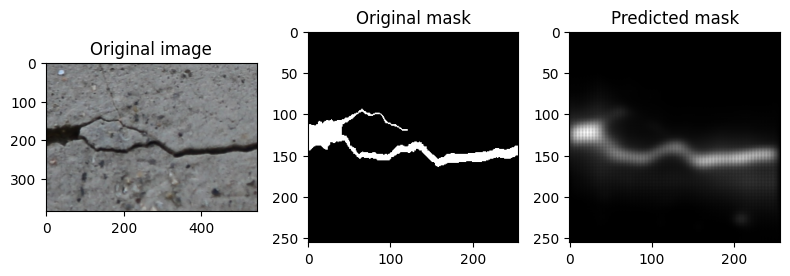

Val F1 Score: 0.5727014146589561
Val Precision: 0.6136441618730447
Val Recall: 0.5368803969697504
Epoch 2/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 3339.0342.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 18394.9355.
--------------------------------------------------


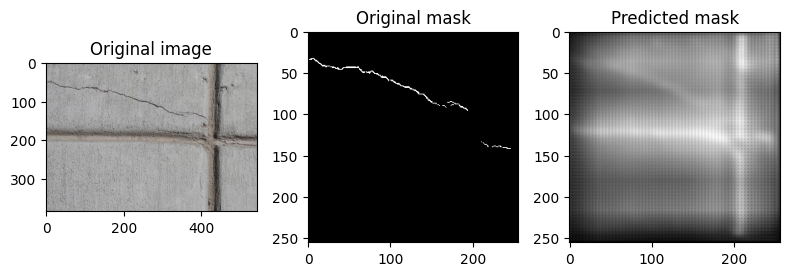

Val F1 Score: 0.1287551082027198
Val Precision: 0.8693107276213543
Val Recall: 0.06952639081031257
Epoch 3/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 2852.0142.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 1081.1978.
--------------------------------------------------


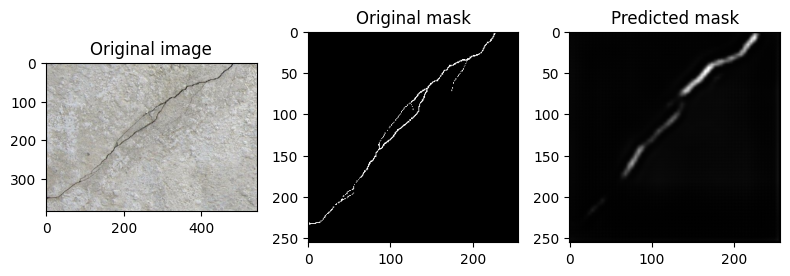

Val F1 Score: 0.5060063671736823
Val Precision: 0.36090422847916037
Val Recall: 0.8462375769048746
Epoch 4/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 2589.8156.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 1021.1823.
--------------------------------------------------


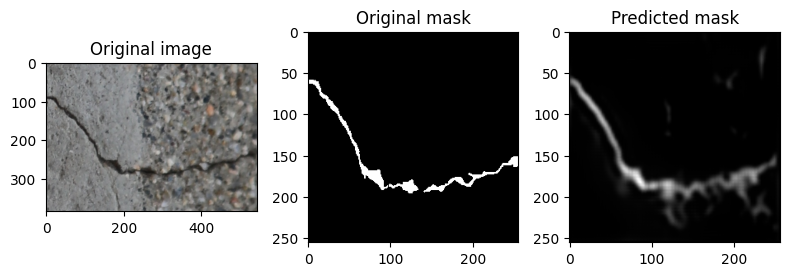

Val F1 Score: 0.7049153628161001
Val Precision: 0.6551821576344737
Val Recall: 0.7628190064388777
Epoch 5/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 2468.9218.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 763.2986.
--------------------------------------------------


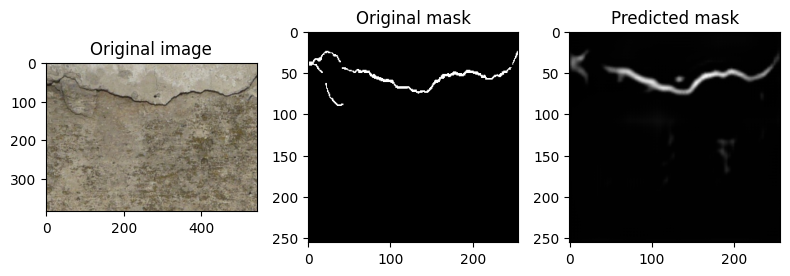

Val F1 Score: 0.7710986260892289
Val Precision: 0.7742658189524675
Val Recall: 0.7679572389493914
Epoch 6/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 2399.7640.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 818.7363.
--------------------------------------------------


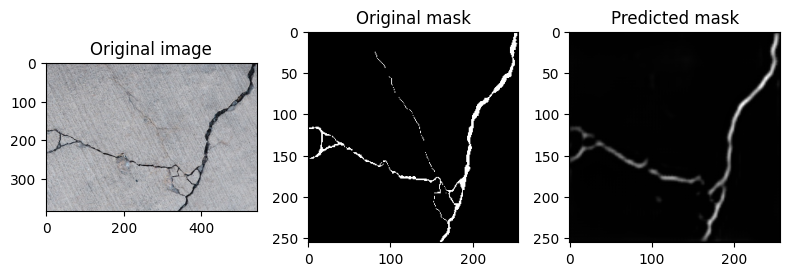

Val F1 Score: 0.6360645298238166
Val Precision: 0.48384297103643154
Val Recall: 0.9280322093608455
Epoch 7/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 2290.8998.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 771.1132.
--------------------------------------------------


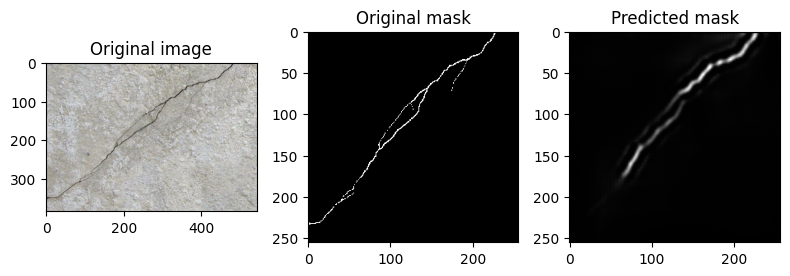

Val F1 Score: 0.67539980459711
Val Precision: 0.5302048642648097
Val Recall: 0.930106575080551
Epoch 8/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 2378.0759.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 726.7311.
--------------------------------------------------


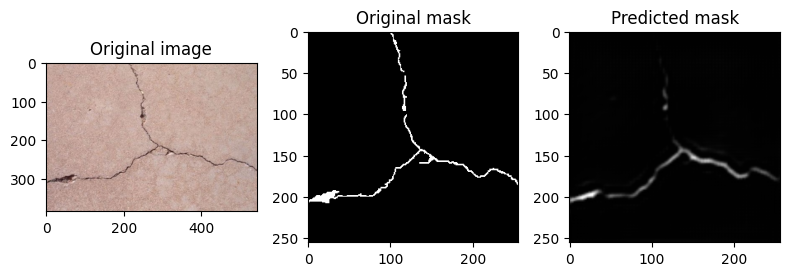

Val F1 Score: 0.7221859193107287
Val Precision: 0.6022807548693108
Val Recall: 0.9017012661287885
Epoch 9/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 2226.5944.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 832.1562.
--------------------------------------------------


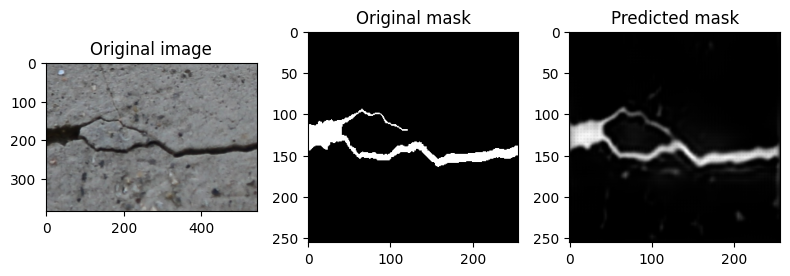

Val F1 Score: 0.7723956593424356
Val Precision: 0.7233424159854678
Val Recall: 0.828585961342828
Epoch 10/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 2099.1569.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 811.6364.
--------------------------------------------------


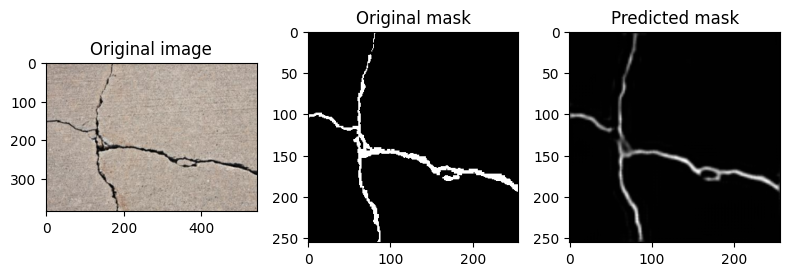

Val F1 Score: 0.6657959303248173
Val Precision: 0.5504490866888687
Val Recall: 0.8423003273827908
Epoch 11/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 2096.8628.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 745.3094.
--------------------------------------------------


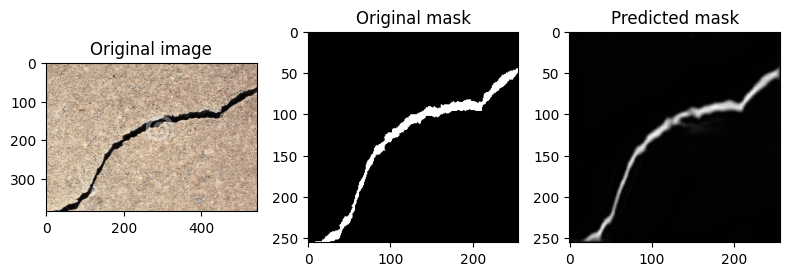

Val F1 Score: 0.7061303527220139
Val Precision: 0.5814512059743667
Val Recall: 0.8988735998003058
Epoch 12/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 2085.2634.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 583.6099.
--------------------------------------------------


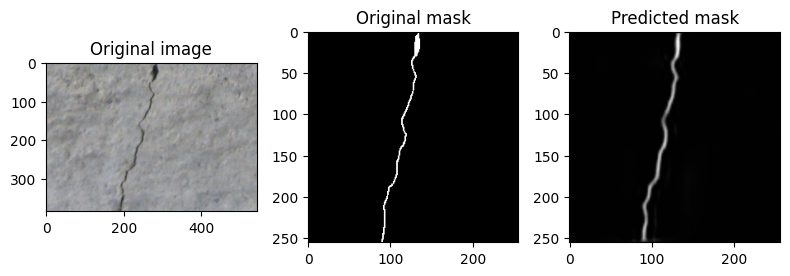

Val F1 Score: 0.8172447459020605
Val Precision: 0.8025229589262287
Val Recall: 0.8325167504187605
Epoch 13/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1986.0774.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 676.7531.
--------------------------------------------------


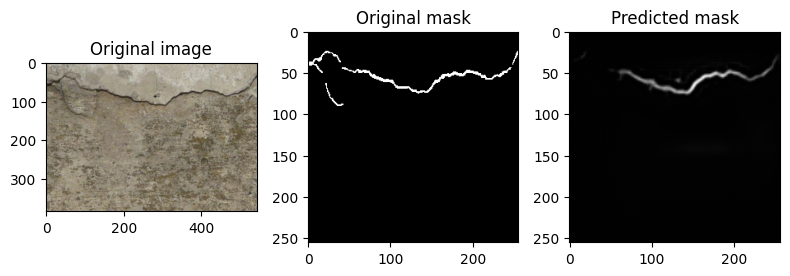

Val F1 Score: 0.8020035174690678
Val Precision: 0.7869411645978404
Val Recall: 0.817653720325476
Epoch 14/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1876.4663.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 592.7782.
--------------------------------------------------


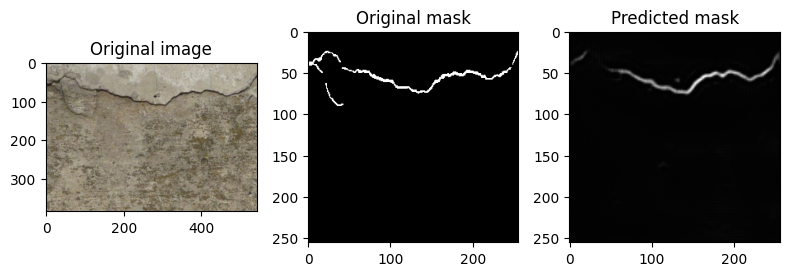

Val F1 Score: 0.7924263515884062
Val Precision: 0.7066101523867191
Val Recall: 0.901968361931262
Epoch 15/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1824.7511.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 579.3275.
--------------------------------------------------


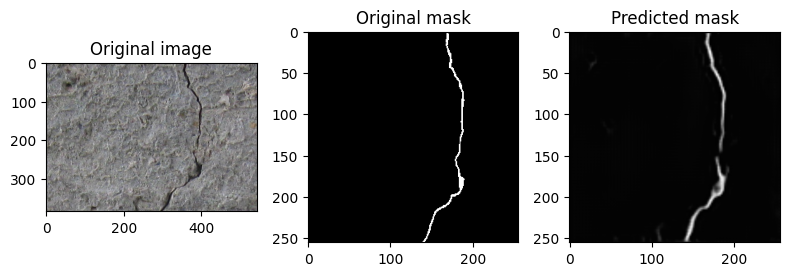

Val F1 Score: 0.8052771758757674
Val Precision: 0.7200928448884852
Val Recall: 0.9133195095102783
Epoch 16/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1784.4288.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 637.0917.
--------------------------------------------------


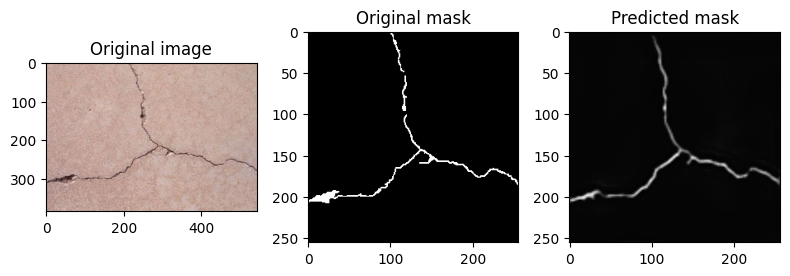

Val F1 Score: 0.7535124746067854
Val Precision: 0.6251286709052377
Val Recall: 0.9482579143959341
Epoch 17/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1834.8583.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 620.4129.
--------------------------------------------------


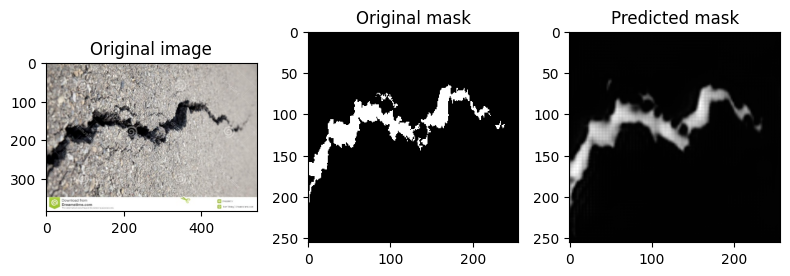

Val F1 Score: 0.8079925326440388
Val Precision: 0.7949540821475426
Val Recall: 0.8214658157093396
Epoch 18/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1867.0591.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 591.9957.
--------------------------------------------------


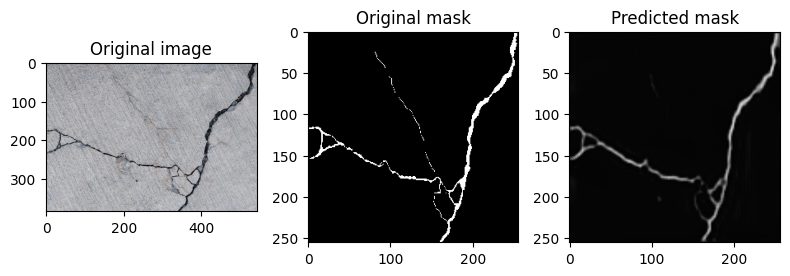

Val F1 Score: 0.789422610383309
Val Precision: 0.6896155010596428
Val Recall: 0.9230083475160061
Epoch 19/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1686.8498.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 622.5086.
--------------------------------------------------


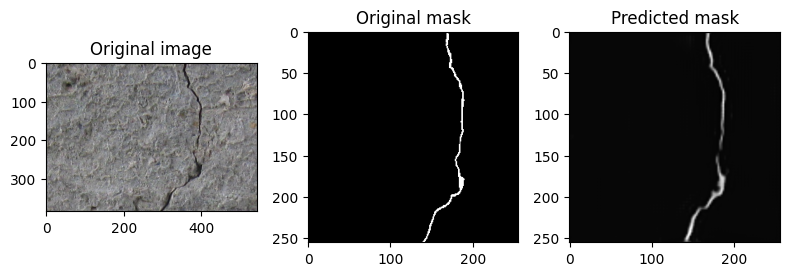

Val F1 Score: 0.7739386099023874
Val Precision: 0.6641235240690282
Val Recall: 0.9272650415668592
Epoch 20/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1707.7917.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 761.5355.
--------------------------------------------------


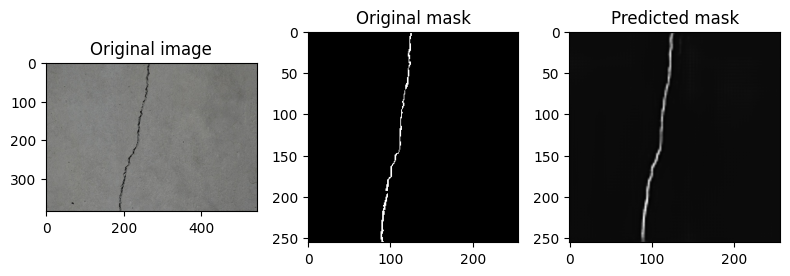

Val F1 Score: 0.6640804978154375
Val Precision: 0.5061862952871127
Val Recall: 0.9651337309986531
Epoch 21/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1616.2589.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 494.1961.
--------------------------------------------------


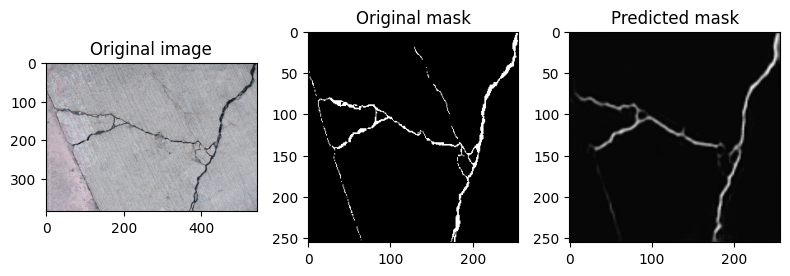

Val F1 Score: 0.8470310979046057
Val Precision: 0.8342516903824806
Val Recall: 0.8602081165452653
Epoch 22/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1665.7939.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 488.8035.
--------------------------------------------------


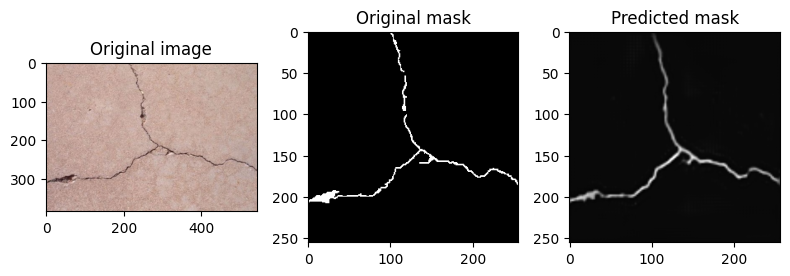

Val F1 Score: 0.8440545184805693
Val Precision: 0.7980825512160662
Val Recall: 0.8956464619008788
Epoch 23/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1594.4549.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 619.8430.
--------------------------------------------------


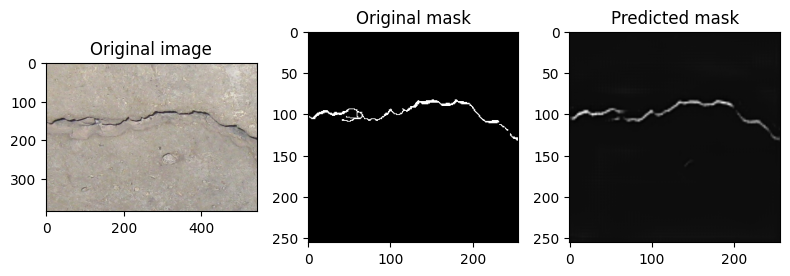

Val F1 Score: 0.7778082093906665
Val Precision: 0.6591785245736199
Val Recall: 0.9485072026022305
Epoch 24/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1628.9708.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 578.3187.
--------------------------------------------------


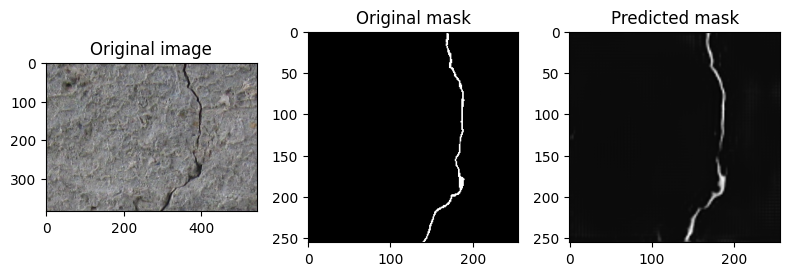

Val F1 Score: 0.7883511556113765
Val Precision: 0.6777878696134827
Val Recall: 0.942016382405745
Epoch 25/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1635.1217.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 537.6661.
--------------------------------------------------


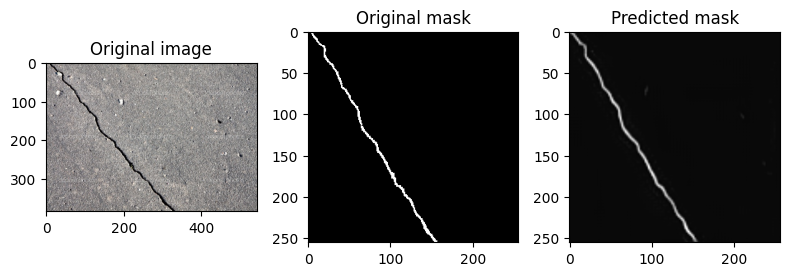

Val F1 Score: 0.8184351741549087
Val Precision: 0.755737208598244
Val Recall: 0.8924774753301234
Epoch 26/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1571.5919.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 594.6367.
--------------------------------------------------


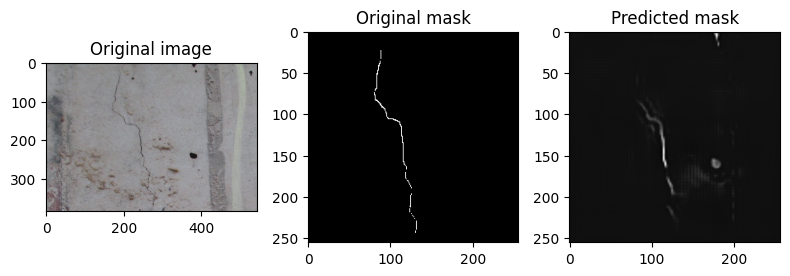

Val F1 Score: 0.7829976036254064
Val Precision: 0.6660813401957816
Val Recall: 0.9496963941408386
Epoch 27/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1527.2009.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 513.2547.
--------------------------------------------------


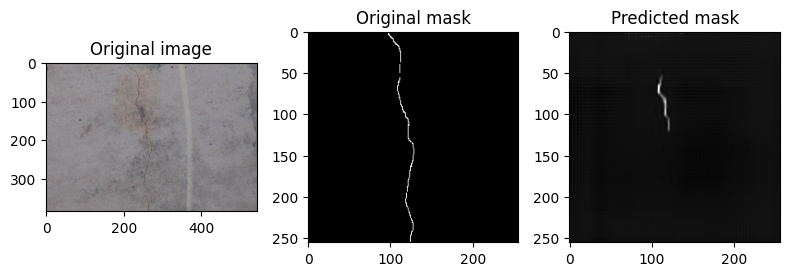

Val F1 Score: 0.8268452296973183
Val Precision: 0.768876778686043
Val Recall: 0.8942673364946712
Epoch 28/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1487.5477.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 478.9032.
--------------------------------------------------


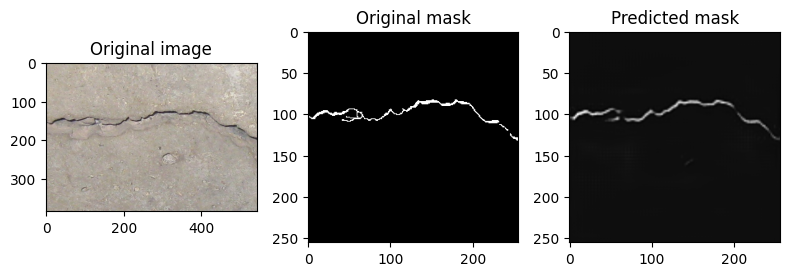

Val F1 Score: 0.8438057184593242
Val Precision: 0.7928146129781007
Val Recall: 0.9018068278347912
Epoch 29/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1565.5512.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 507.9479.
--------------------------------------------------


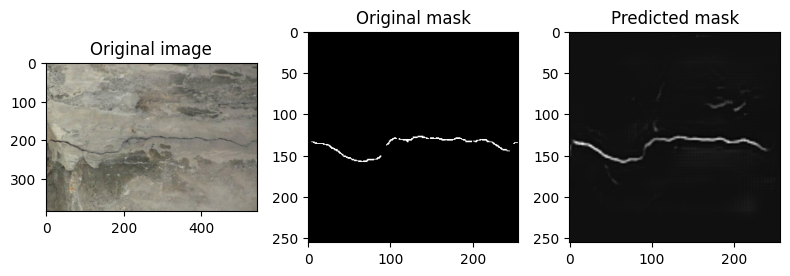

Val F1 Score: 0.8227096774193549
Val Precision: 0.7399737612271672
Val Recall: 0.9262758969176351
Epoch 30/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1537.6931.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 489.6900.
--------------------------------------------------


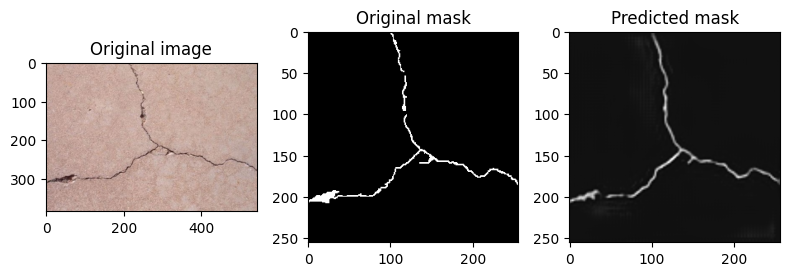

Val F1 Score: 0.8397093601857698
Val Precision: 0.7919063477646584
Val Recall: 0.8936543367346939
Epoch 31/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1496.9776.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 577.6435.
--------------------------------------------------


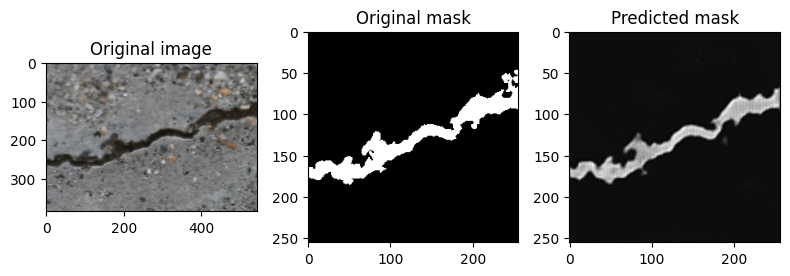

Val F1 Score: 0.7943392456245519
Val Precision: 0.6820062569381371
Val Recall: 0.9509737701227063
Epoch 32/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1474.9305.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 595.1676.
--------------------------------------------------


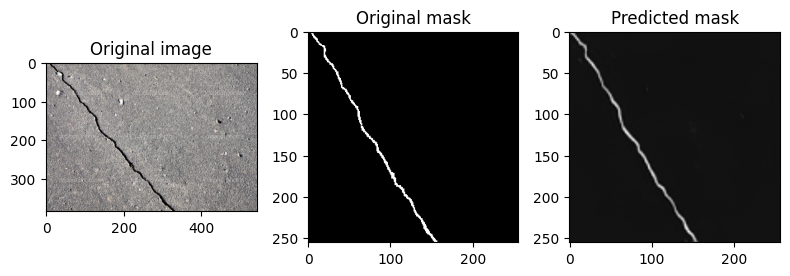

Val F1 Score: 0.7788523990033183
Val Precision: 0.6655969320819457
Val Recall: 0.9385530510018215
Epoch 33/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1463.0989.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 505.4407.
--------------------------------------------------


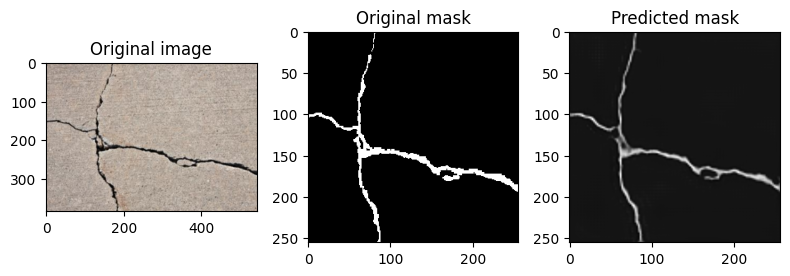

Val F1 Score: 0.831165936772195
Val Precision: 0.7527298415581795
Val Recall: 0.9278499278499278
Epoch 34/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1416.0662.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 518.7251.
--------------------------------------------------


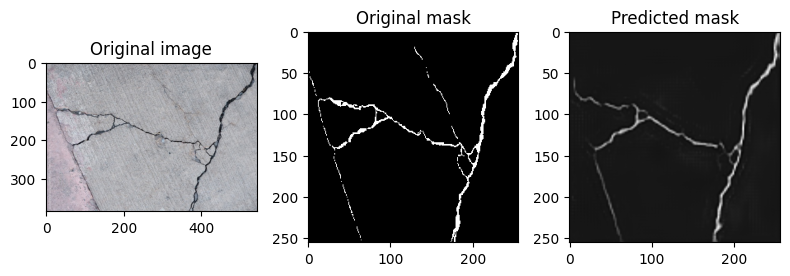

Val F1 Score: 0.8197018236978844
Val Precision: 0.7307498233928752
Val Recall: 0.9333109919571045
Epoch 35/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1537.1521.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 460.8677.
--------------------------------------------------


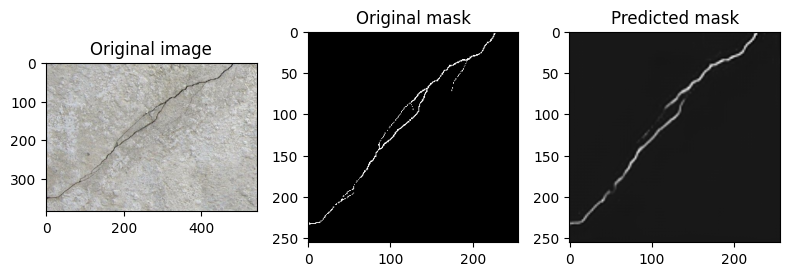

Val F1 Score: 0.8516806277171032
Val Precision: 0.8105964274901605
Val Recall: 0.897151792695186
Epoch 36/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1446.4338.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 661.8852.
--------------------------------------------------


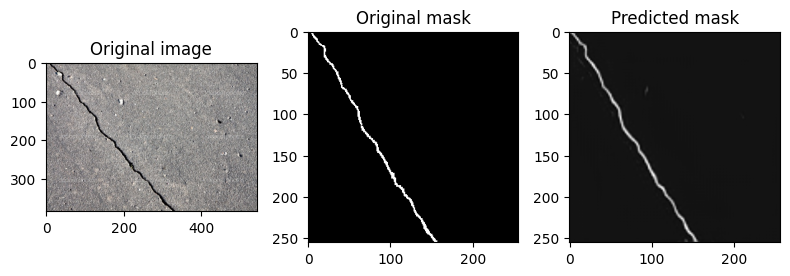

Val F1 Score: 0.7490341861651724
Val Precision: 0.6222222222222222
Val Recall: 0.9407671885013275
Epoch 37/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1421.4948.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 453.1112.
--------------------------------------------------


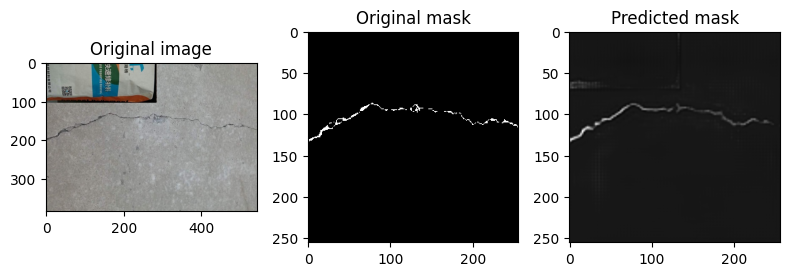

Val F1 Score: 0.8526024970474102
Val Precision: 0.8159652840851751
Val Recall: 0.8926844348267715
Epoch 38/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1388.8302.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 613.8045.
--------------------------------------------------


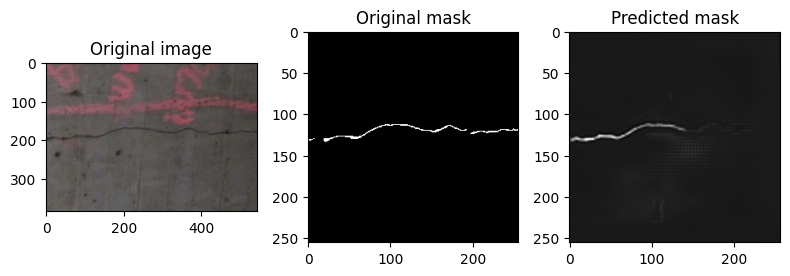

Val F1 Score: 0.7741318739096146
Val Precision: 0.6537894843071955
Val Recall: 0.9487712720775607
Epoch 39/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1404.1384.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 455.6375.
--------------------------------------------------


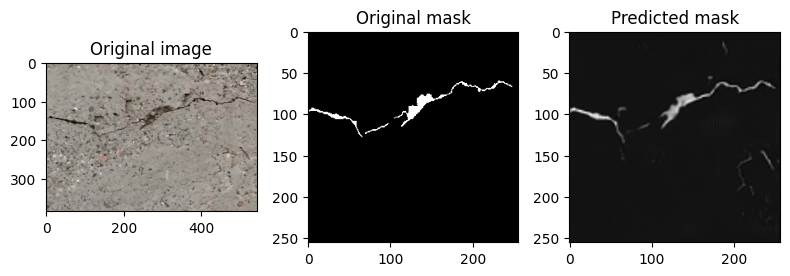

Val F1 Score: 0.8519860157533381
Val Precision: 0.8165102432132405
Val Recall: 0.8906845152909575
Epoch 40/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1326.2862.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 480.0786.
--------------------------------------------------


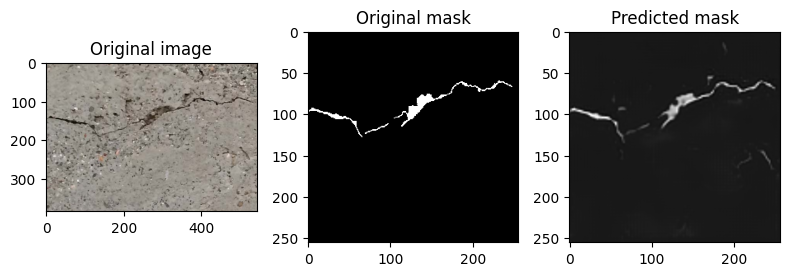

Val F1 Score: 0.8438434194649477
Val Precision: 0.7833888384297104
Val Recall: 0.9144088960090467
Epoch 41/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1278.9216.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 461.9573.
--------------------------------------------------


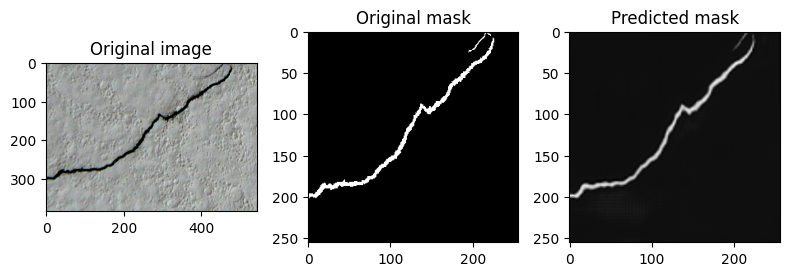

Val F1 Score: 0.8482041109188369
Val Precision: 0.811242304975275
Val Recall: 0.8886948061998364
Epoch 42/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1318.6219.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 503.8698.
--------------------------------------------------


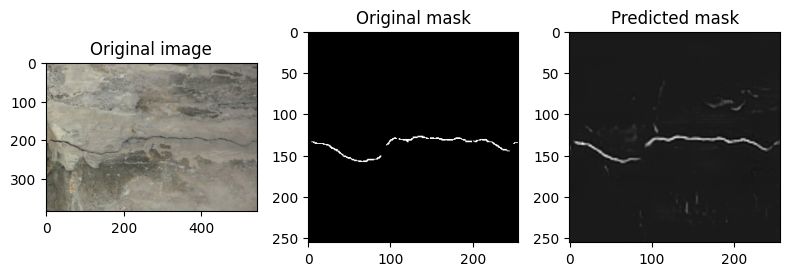

Val F1 Score: 0.8366118550181009
Val Precision: 0.7742860026238773
Val Recall: 0.9098498683680004
Epoch 43/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1294.0653.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 508.8303.
--------------------------------------------------


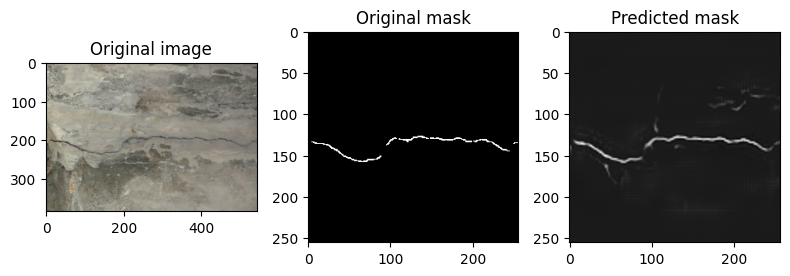

Val F1 Score: 0.825768568825296
Val Precision: 0.7408416590977899
Val Recall: 0.9326879097423387
Epoch 44/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1280.8361.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 443.5866.
--------------------------------------------------


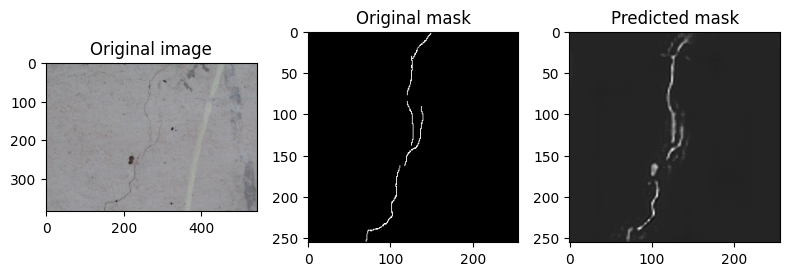

Val F1 Score: 0.8487633115767778
Val Precision: 0.7979008981733777
Val Recall: 0.9065517004150709
Epoch 45/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1284.1024.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 469.9240.
--------------------------------------------------


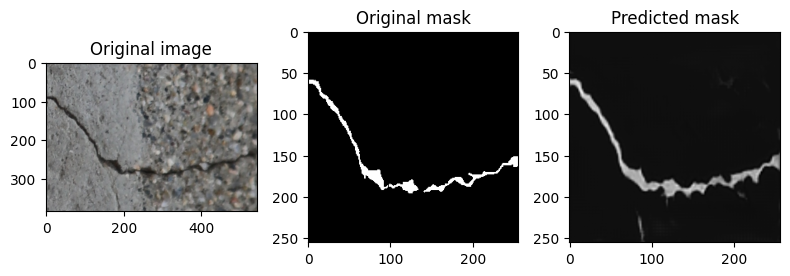

Val F1 Score: 0.8542336859392358
Val Precision: 0.8923806640427894
Val Recall: 0.8192143783583472
Epoch 46/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1277.6649.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 437.2522.
--------------------------------------------------


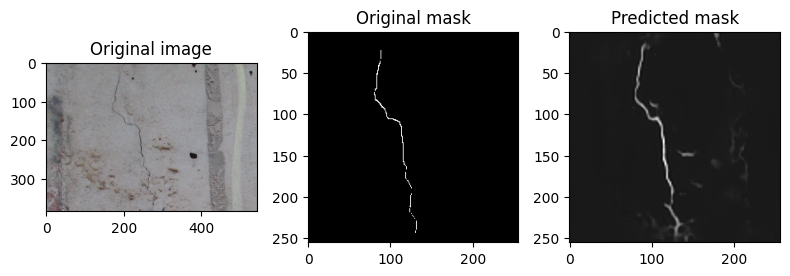

Val F1 Score: 0.8584062548542433
Val Precision: 0.8365324452517913
Val Recall: 0.8814547001276053
Epoch 47/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1238.6315.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 475.7263.
--------------------------------------------------


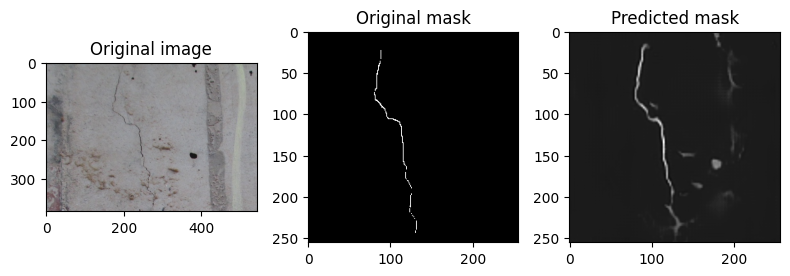

Val F1 Score: 0.8472938720739526
Val Precision: 0.8602482591583409
Val Recall: 0.8347238542890717
Epoch 48/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1260.2784.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 444.4443.
--------------------------------------------------


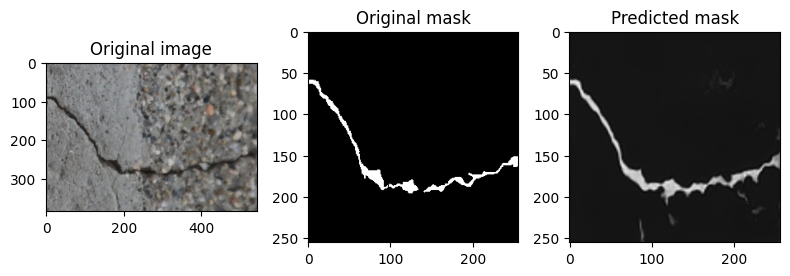

Val F1 Score: 0.8538196589160271
Val Precision: 0.8230497527500252
Val Recall: 0.8869795971636142
Epoch 49/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1261.0355.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 459.1117.
--------------------------------------------------


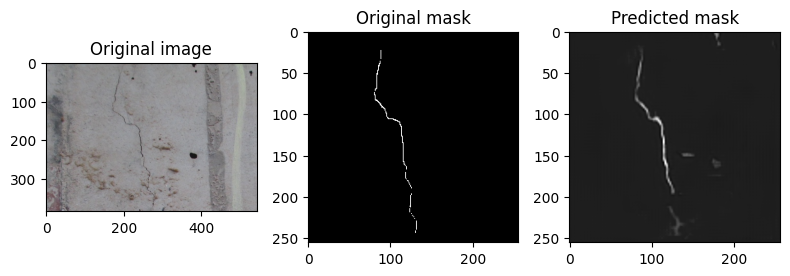

Val F1 Score: 0.8476904805212869
Val Precision: 0.7995357755575739
Val Recall: 0.9020174879315056
Epoch 50/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1199.7851.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 448.0863.
--------------------------------------------------


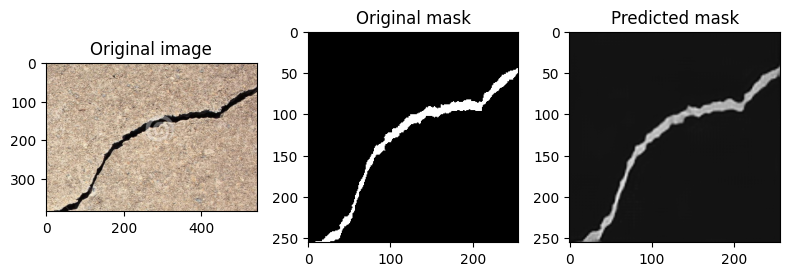

Val F1 Score: 0.8554160076256717
Val Precision: 0.824139671006156
Val Recall: 0.8891598797961762
Epoch 51/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1202.5299.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 452.0809.
--------------------------------------------------


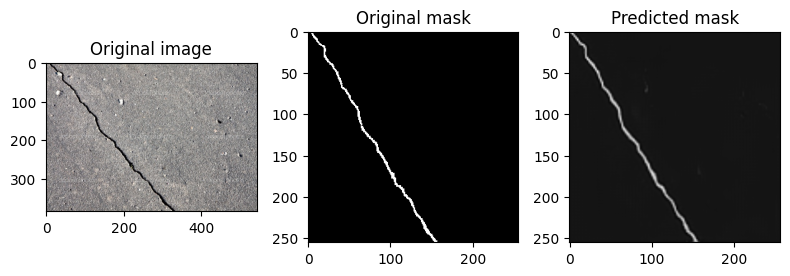

Val F1 Score: 0.8503026909382891
Val Precision: 0.8122111212029468
Val Recall: 0.892142952157141
Epoch 52/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1228.6288.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 469.8944.
--------------------------------------------------


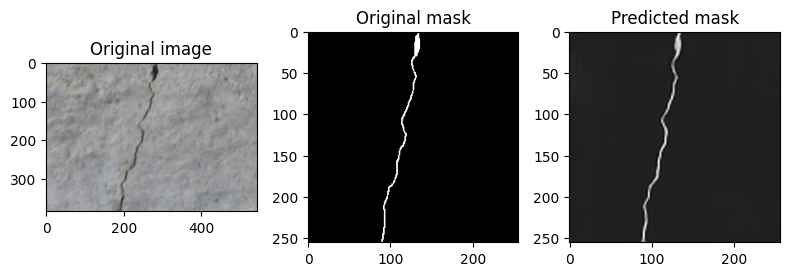

Val F1 Score: 0.8425161192935543
Val Precision: 0.7885760419820366
Val Recall: 0.9043772134904284
Epoch 53/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1184.3646.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 463.4322.
--------------------------------------------------


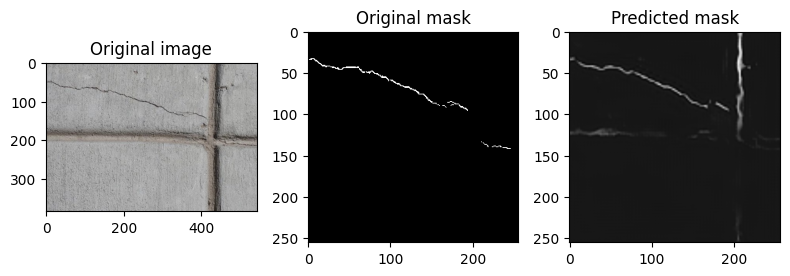

Val F1 Score: 0.8453761426402662
Val Precision: 0.7923705722070845
Val Recall: 0.9059817225145389
Epoch 54/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1176.5331.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 442.2524.
--------------------------------------------------


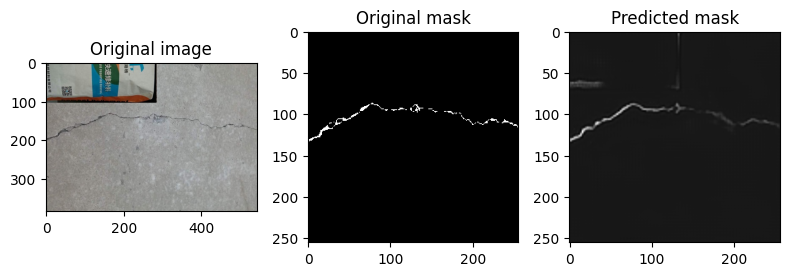

Val F1 Score: 0.8562877997914494
Val Precision: 0.8287213644161873
Val Recall: 0.8857512673929457
Epoch 55/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1188.6850.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 457.7665.
--------------------------------------------------


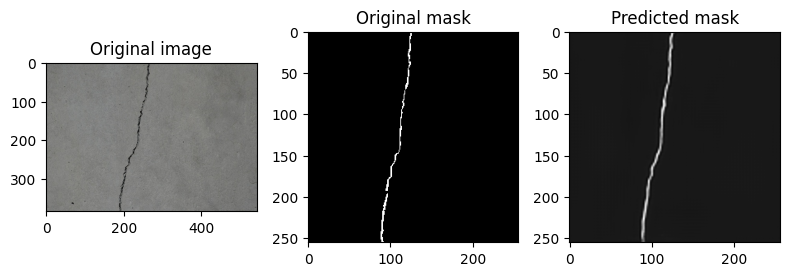

Val F1 Score: 0.857958745557097
Val Precision: 0.8550408719346049
Val Recall: 0.8608966021785076
Epoch 56/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1221.3240.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 449.5300.
--------------------------------------------------


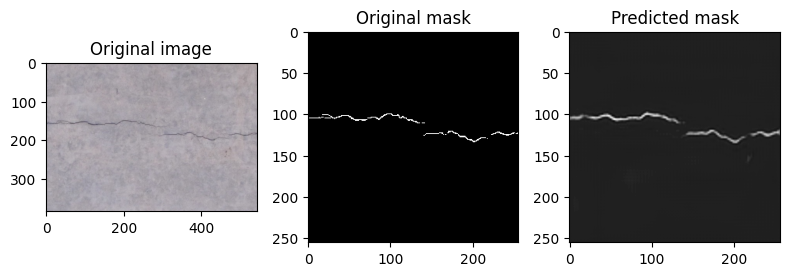

Val F1 Score: 0.8565973350666233
Val Precision: 0.8511857906953275
Val Recall: 0.8620781291522721
Epoch 57/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1180.2765.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 444.9572.
--------------------------------------------------


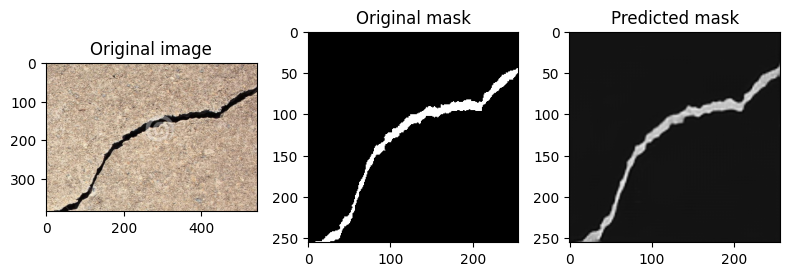

Val F1 Score: 0.8601959216313474
Val Precision: 0.8684428297507316
Val Recall: 0.8521041687295772
Epoch 58/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1171.8627.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 449.4561.
--------------------------------------------------


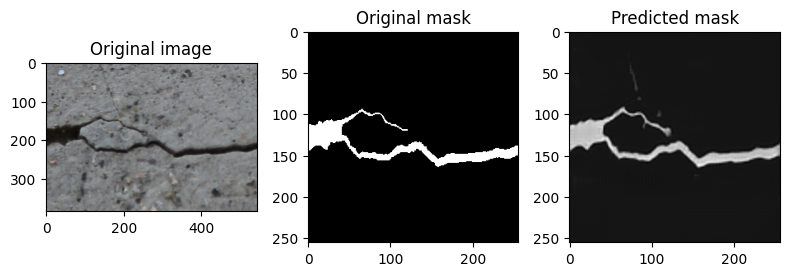

Val F1 Score: 0.8573052755529839
Val Precision: 0.8522958926228681
Val Recall: 0.8623738920883879
Epoch 59/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1153.9820.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 450.7378.
--------------------------------------------------


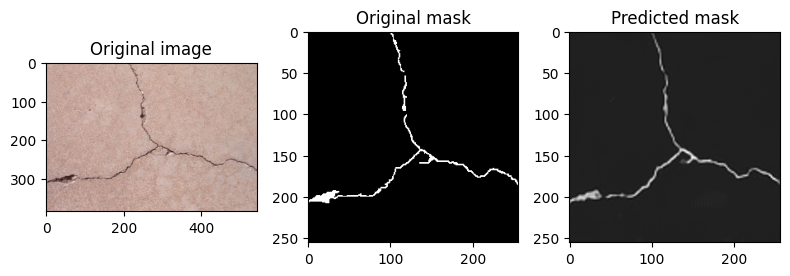

Val F1 Score: 0.8472546476437527
Val Precision: 0.7910788172368554
Val Recall: 0.9120186154741129
Epoch 60/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1145.1582.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 449.7213.
--------------------------------------------------


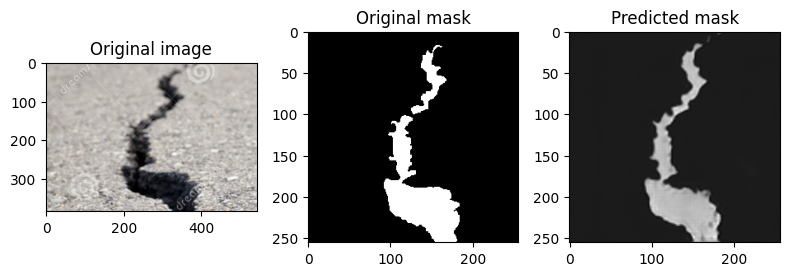

Val F1 Score: 0.8552251539228484
Val Precision: 0.8396810979917247
Val Recall: 0.8713555630026809
Epoch 61/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1161.0801.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 451.0824.
--------------------------------------------------


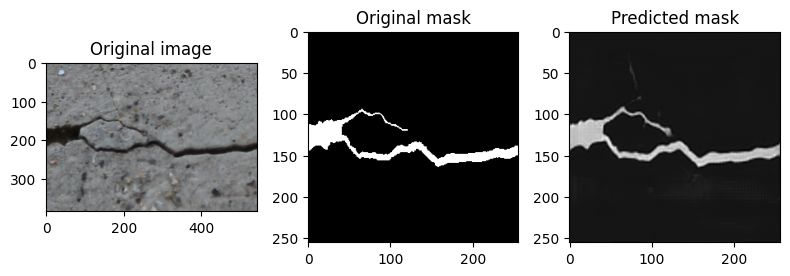

Val F1 Score: 0.8555466221370112
Val Precision: 0.8376223635079221
Val Recall: 0.8742547768017022
Epoch 62/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1158.0326.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 450.5506.
--------------------------------------------------


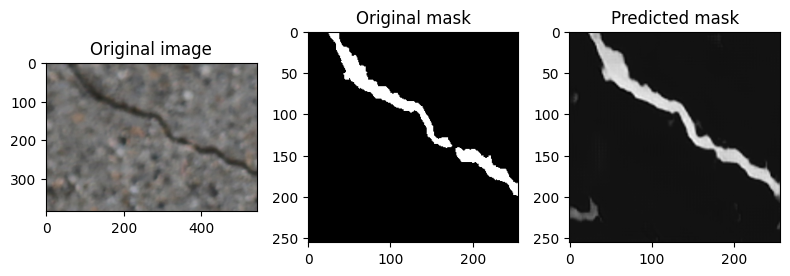

Val F1 Score: 0.8584347966202402
Val Precision: 0.860228075486931
Val Recall: 0.8566489789355202
Epoch 63/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1149.8056.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 449.0021.
--------------------------------------------------


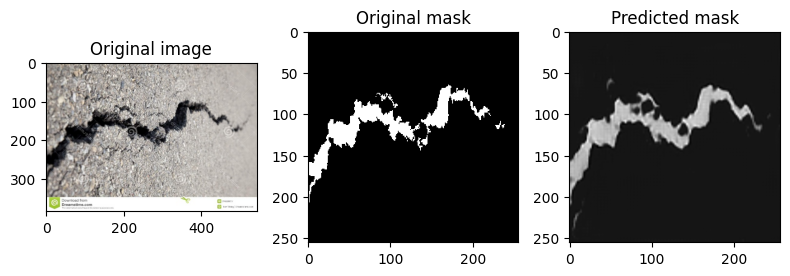

Val F1 Score: 0.8575038721773864
Val Precision: 0.8492481582399839
Val Recall: 0.8659216727377498
Epoch 64/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1116.4458.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 439.7747.
--------------------------------------------------


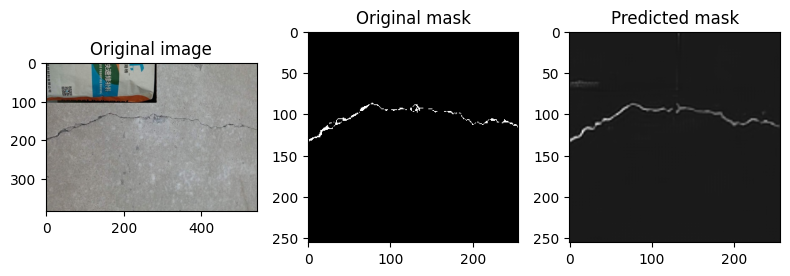

Val F1 Score: 0.8596770897200081
Val Precision: 0.8490059541830659
Val Recall: 0.8706198903032185
Epoch 65/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1109.4433.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 447.3045.
--------------------------------------------------


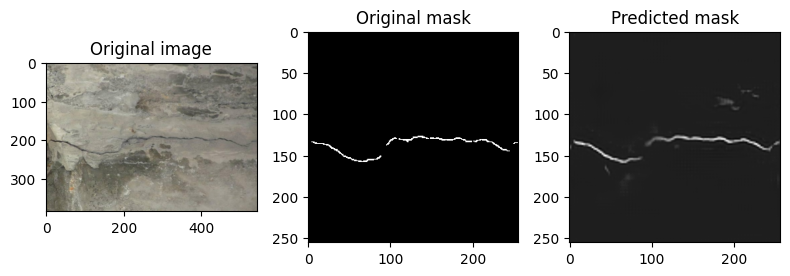

Val F1 Score: 0.8568698127122958
Val Precision: 0.8324755272984156
Val Recall: 0.8827369232086294
Epoch 66/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1099.2523.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 456.5479.
--------------------------------------------------


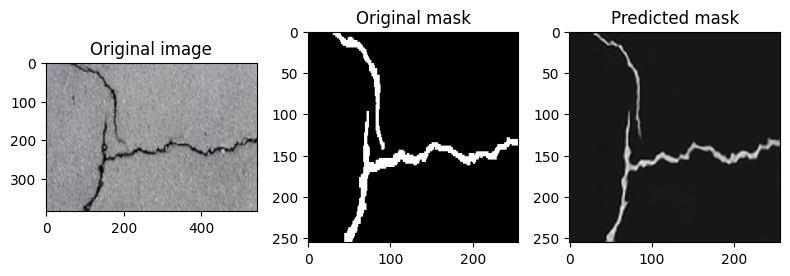

Val F1 Score: 0.8503368215904759
Val Precision: 0.8101927540619639
Val Recall: 0.8946664586444381
Epoch 67/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1107.8057.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 448.6617.
--------------------------------------------------


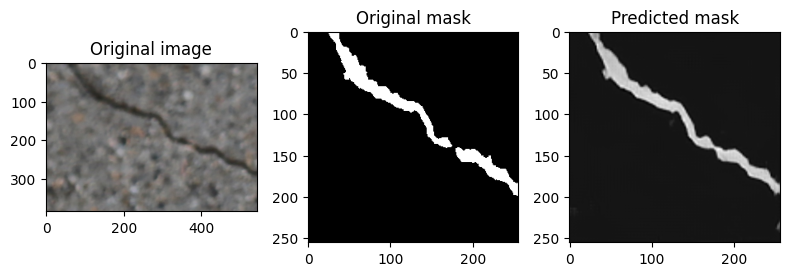

Val F1 Score: 0.8570035253837792
Val Precision: 0.8512867090523766
Val Recall: 0.8627976434007038
Epoch 68/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1159.0786.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 553.0658.
--------------------------------------------------


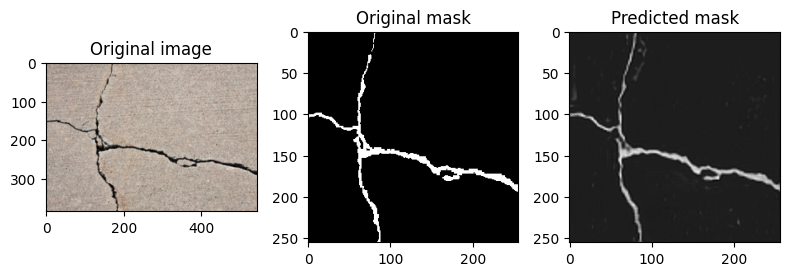

Val F1 Score: 0.8441614108137897
Val Precision: 0.8347562821677263
Val Recall: 0.853780888090667
Epoch 69/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1305.7952.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 510.5518.
--------------------------------------------------


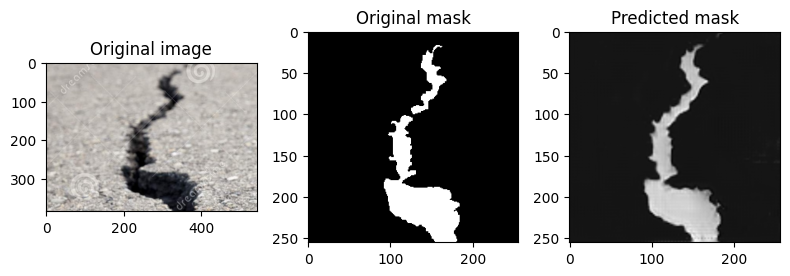

Val F1 Score: 0.8317620474013349
Val Precision: 0.7986476940155415
Val Recall: 0.8677412280701754
Epoch 70/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1437.5996.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 509.0025.
--------------------------------------------------


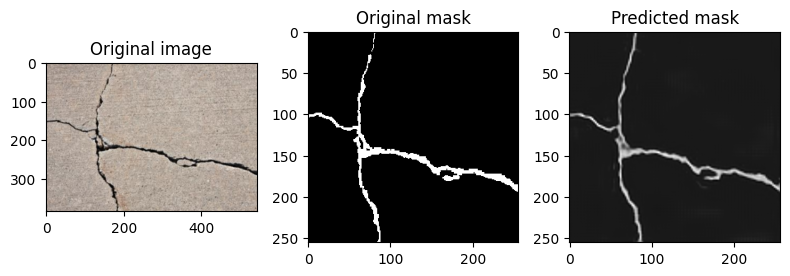

Val F1 Score: 0.8386932834607252
Val Precision: 0.8327177313553336
Val Recall: 0.8447552161182661
Epoch 71/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1300.2275.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 534.3553.
--------------------------------------------------


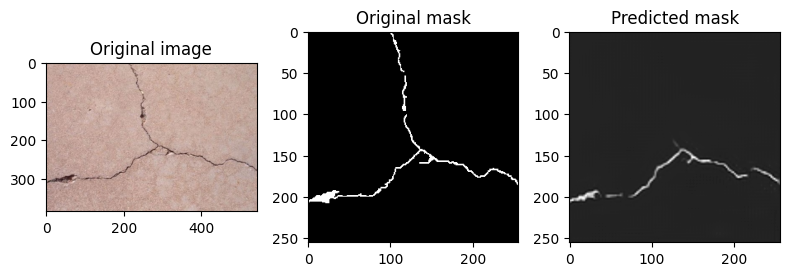

Val F1 Score: 0.8177818202489909
Val Precision: 0.7258855585831062
Val Recall: 0.9363186670137985
Epoch 72/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1190.7624.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 462.6538.
--------------------------------------------------


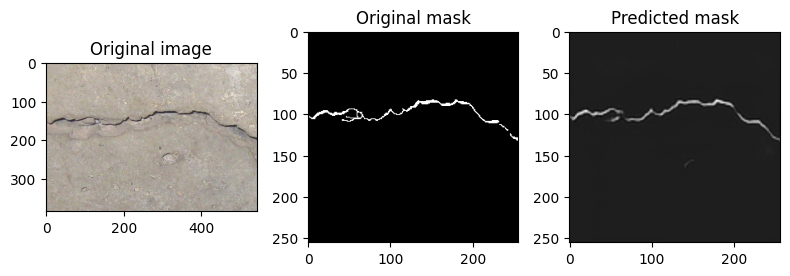

Val F1 Score: 0.8488245234988342
Val Precision: 0.8008880815420325
Val Recall: 0.9028646840656215
Epoch 73/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1133.0254.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 450.0233.
--------------------------------------------------


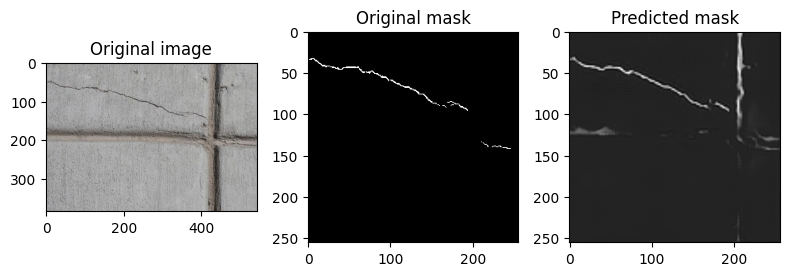

Val F1 Score: 0.8486744535977572
Val Precision: 0.7911797355939045
Val Recall: 0.9151802390735898
Epoch 74/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1122.9618.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 437.4431.
--------------------------------------------------


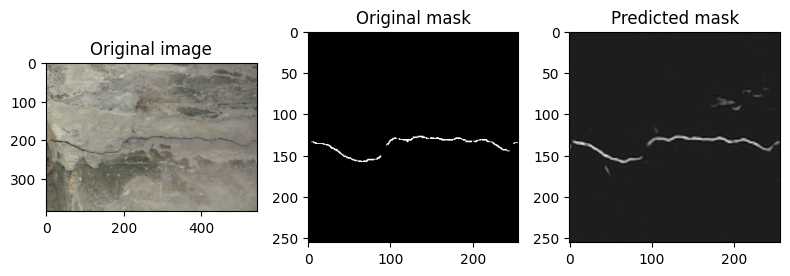

Val F1 Score: 0.8587424722907994
Val Precision: 0.8389746694923806
Val Recall: 0.8794642857142857
Epoch 75/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1110.8688.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 458.7448.
--------------------------------------------------


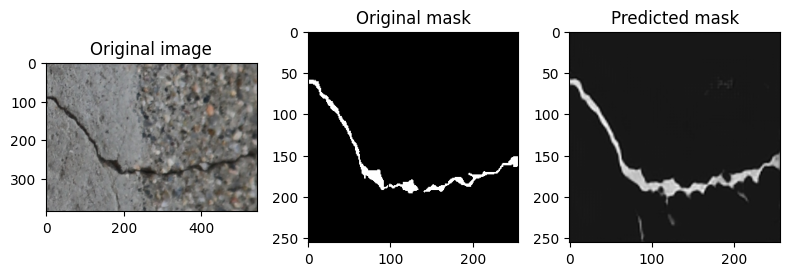

Val F1 Score: 0.8556162292290529
Val Precision: 0.8823493793521041
Val Recall: 0.8304553484926198
Epoch 76/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1114.4012.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 435.3773.
--------------------------------------------------


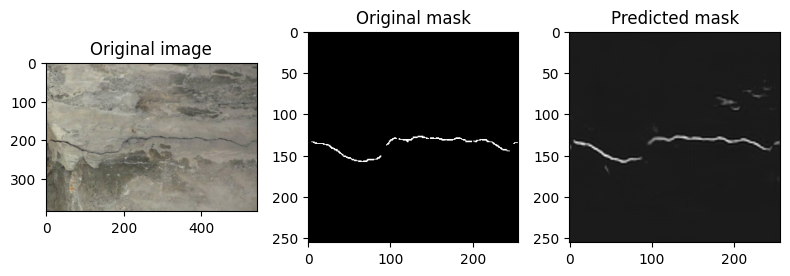

Val F1 Score: 0.859271127016989
Val Precision: 0.8335250782117267
Val Recall: 0.8866583648230848
Epoch 77/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1105.8615.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 456.8075.
--------------------------------------------------


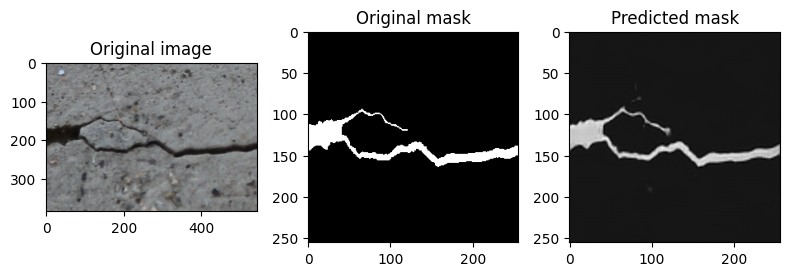

Val F1 Score: 0.8471925320385431
Val Precision: 0.7959027147038046
Val Recall: 0.9055481559729941
Epoch 78/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1125.0487.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 442.2726.
--------------------------------------------------


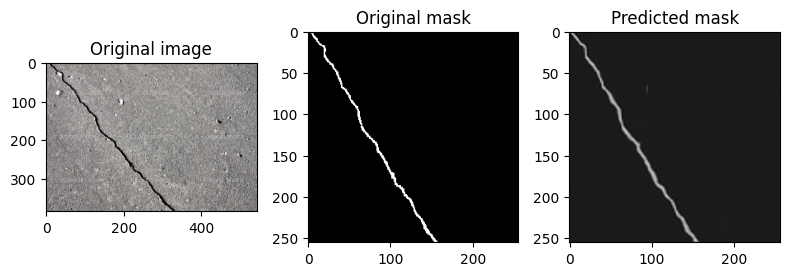

Val F1 Score: 0.8546220590689138
Val Precision: 0.8270057523463518
Val Recall: 0.8841464730379993
Epoch 79/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1126.7917.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 463.8077.
--------------------------------------------------


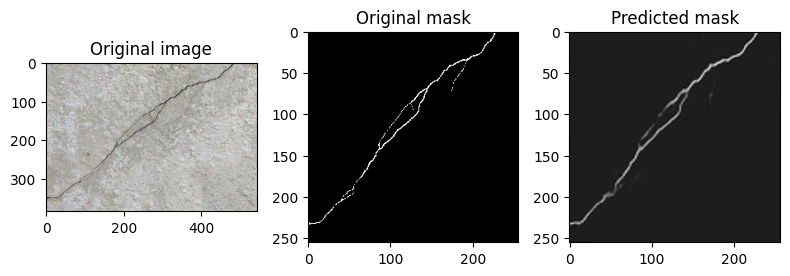

Val F1 Score: 0.8553557154276579
Val Precision: 0.86390150368352
Val Recall: 0.8469773424359355
Epoch 80/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1104.2367.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 455.2324.
--------------------------------------------------


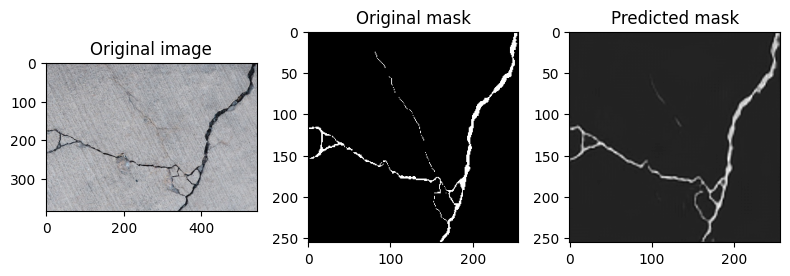

Val F1 Score: 0.8550720077199828
Val Precision: 0.8226864466646483
Val Recall: 0.8901118099231307
Epoch 81/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1087.8168.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 435.9643.
--------------------------------------------------


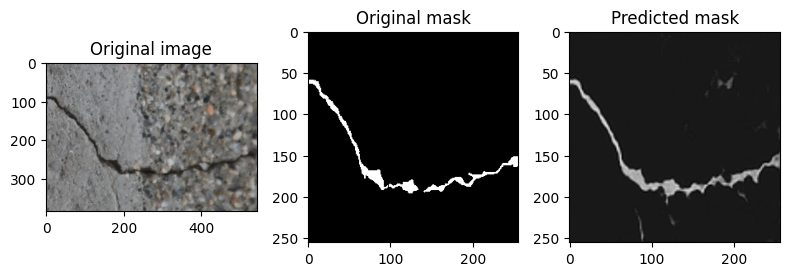

Val F1 Score: 0.8601375286518025
Val Precision: 0.8331415884549399
Val Recall: 0.8889415311726069
Epoch 82/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1090.0801.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 444.5177.
--------------------------------------------------


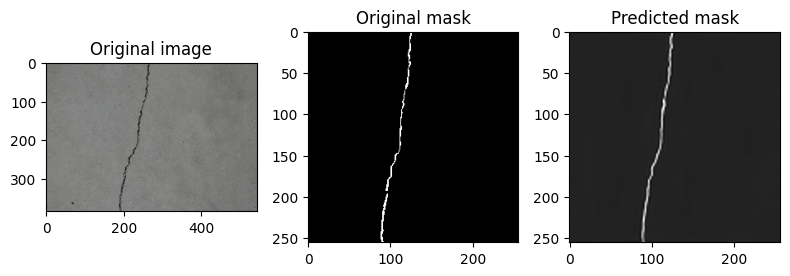

Val F1 Score: 0.8555986321730364
Val Precision: 0.8307397315571703
Val Recall: 0.8819911713024472
Epoch 83/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1061.1675.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 436.1659.
--------------------------------------------------


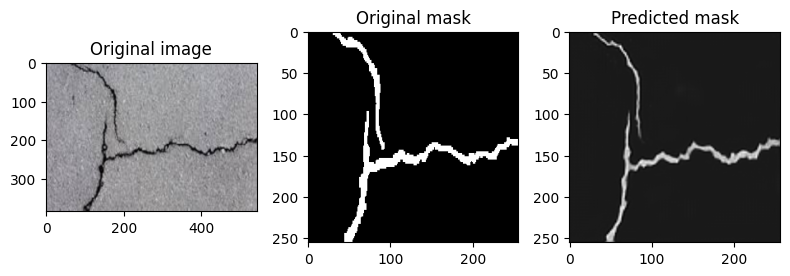

Val F1 Score: 0.8609601542152863
Val Precision: 0.8473710767988697
Val Recall: 0.8749921844063275
Epoch 84/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1089.8138.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 470.9661.
--------------------------------------------------


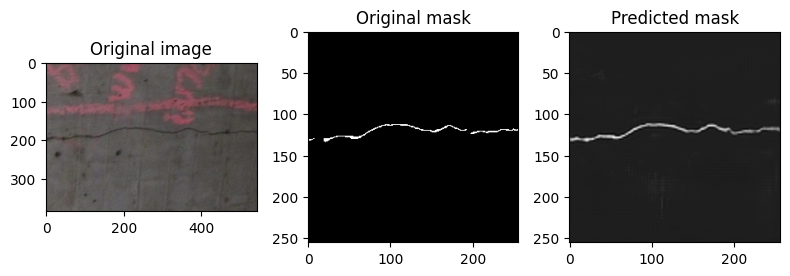

Val F1 Score: 0.8432712754415658
Val Precision: 0.7843980220002018
Val Recall: 0.9116991578107773
Epoch 85/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1112.9964.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 456.6450.
--------------------------------------------------


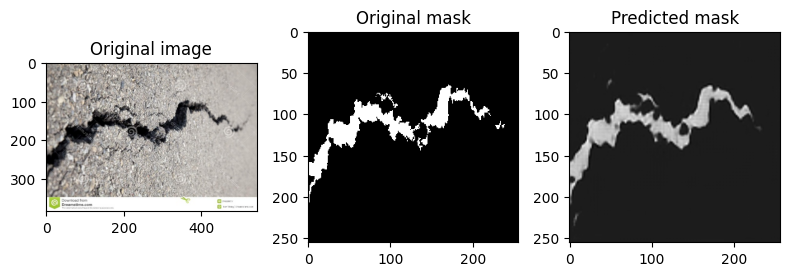

Val F1 Score: 0.8492940323337456
Val Precision: 0.8037137955394086
Val Recall: 0.9003549867727858
Epoch 86/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1095.6445.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 439.0831.
--------------------------------------------------


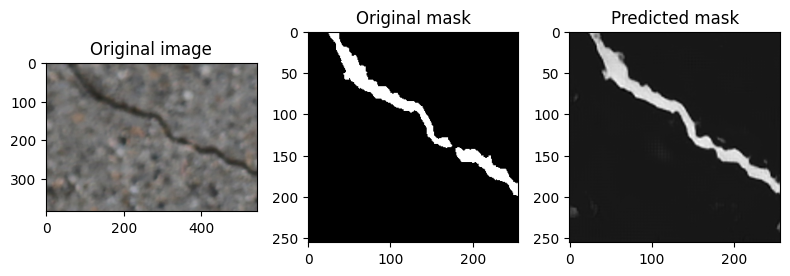

Val F1 Score: 0.8586366998109952
Val Precision: 0.8435765465738218
Val Recall: 0.8742443575208652
Epoch 87/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1065.8748.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 444.6537.
--------------------------------------------------


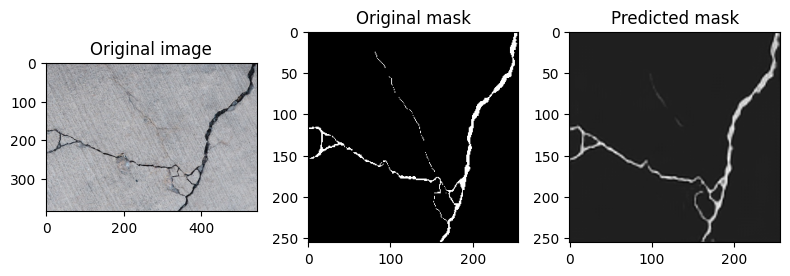

Val F1 Score: 0.8583582826786019
Val Precision: 0.8593198102734887
Val Recall: 0.8573989044627034
Epoch 88/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1056.0575.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 433.8877.
--------------------------------------------------


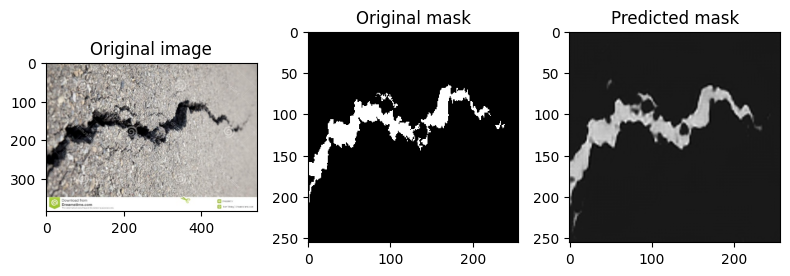

Val F1 Score: 0.8606340886902009
Val Precision: 0.8451306892723787
Val Recall: 0.876716917922948
Epoch 89/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1050.9297.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 440.5323.
--------------------------------------------------


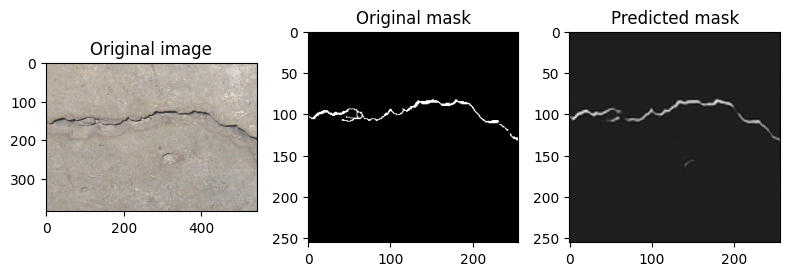

Val F1 Score: 0.8606720572101905
Val Precision: 0.8550610556060148
Val Recall: 0.8663571852185116
Epoch 90/90
current_lr :  0.0001


  0%|          | 0/33 [00:00<?, ?it/s]

Train loss: 1055.2302.


  0%|          | 0/3 [00:00<?, ?it/s]

Valid loss: 441.2328.
--------------------------------------------------


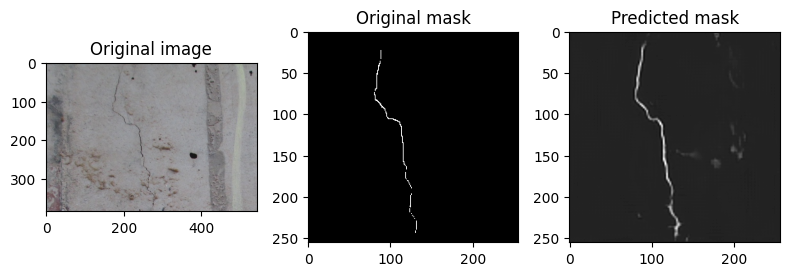

Val F1 Score: 0.8587067730714139
Val Precision: 0.8470077707134928
Val Recall: 0.8707334785766159


In [24]:
train_losses, valid_losses = [], []
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

for epoch in range(CFG['EPOCHS']):

  print(f'Epoch {epoch+1}/{CFG["EPOCHS"]}')
  print('current_lr : ', optimizer.param_groups[0]['lr'])
  epoch_train_losses, epoch_valid_losses = [], []

  model.train()
  for _, batch in enumerate(tqdm(train_dataloader, leave=False)):
    batch_train_loss = train_one_batch(batch, model, criterion, optimizer)
    epoch_train_losses.append(batch_train_loss)

  epoch_train_loss = np.array(epoch_train_losses).mean()
  train_losses.append(epoch_train_loss)

  print(f"Train loss: {epoch_train_loss:.4f}.")

  model.eval()
  y_true, y_pred = [], []

  for i, batch in enumerate(tqdm(valid_dataloader, leave=False)):
    images, masks = batch
    output = model(images)
    batch_valid_loss = criterion(output, masks)
    epoch_valid_losses.append(batch_valid_loss.item())

    y_true.append(masks.cpu().numpy())
    y_pred.append(output.cpu().detach().numpy())

  epoch_valid_loss = np.array(epoch_valid_losses).mean()
  valid_losses.append(epoch_valid_loss)
  print(f'Valid loss: {epoch_valid_loss:.4f}.')
  print('-'*50)

  y_true = np.concatenate(y_true, axis=0)
  y_pred = np.concatenate(y_pred, axis=0)
  y_pred = np.where(y_pred > 127, 255, 0)

  y_true = y_true.reshape(-1) / 255
  y_pred = y_pred.reshape(-1) / 255

  validate_test_image(model, valid)
  print('Val F1 Score:', f1_score(y_pred, y_true))
  print('Val Precision:', precision_score(y_pred, y_true))
  print('Val Recall:', recall_score(y_pred, y_true))

  # if (epoch%10 == 0):
    # torch.save(model.state_dict(), CFG['PATH'])

  # scheduler.step(epoch_valid_loss)
  # early(epoch_valid_loss, model =model)
  # if early.early_stop:
  #   print(f"Validation loss did not improve for {early.patience} epochs. Training stopped.")
  #   model.load_state_dict(torch.load(CFG['PATH']))
  #   break


In [ ]:
y_pred = []
# test_model = get_model()
# test_model = torch.load(CFG['PATH'])
my_submission = pd.read_csv(os.path.join(base_path, 'test_files.csv'))

# test_model.eval()
model.eval()
for path, images in tqdm(zip(my_submission['ID'], test_dataloader), total=len(test_dataloader)):
  output = model(images['image'].to(device)).cpu().detach().numpy()
  output = np.where(output.astype(np.float32) > 127, 255, 0) / 255
  output = output[0][0].reshape(-1, )
  img = list(map(int, output.tolist()))
  label = "".join(map(str, img))

  chunk_size = 8
  chunks = [label[i:i+chunk_size] for i in range(0, len(label), chunk_size)]

  for i in range(len(chunks)):
    y_pred.append([path+str(i), "2" + chunks[i]])


  0%|          | 0/237 [00:00<?, ?it/s]

In [ ]:
submission = pd.DataFrame(y_pred, columns=['ID', 'label'])
submission['label'] = submission['label'].astype(int)
submission.to_csv('./results.csv', index=False)